### Dataset: MERFISH spatial transcriptomics dataset of a single adult mouse brain (Zhuang-ABCA-1) (Xiaowei Zhuang)

<font size="3"> This spatially resolved cell atlas of the whole mouse brain provides a systematic characterization of the spatial organization of transcriptomically defined cell types across the entire adult mouses brain using in situ, single-cell transcriptomic profiling with multiplexed error-robust fluorescence in situ hybridization (MERFISH). A gene panel of 1,122 genes was imaged in 9 million brain cells using **MERFISH**, and spatially resolved, single-cell expression profiling was performed at the whole-transcriptome scale by integrating the MERFISH data with the whole-brain single-cell RNA-sequencing (scRNA-seq) dataset previously generated by the Allen Institute. This resulted in the generation of a comprehensive cell atlas of more than 5,000 transcriptionally distinct cell clusters, belonging to ∼300 major cell types (subclasses), across the whole mouse brain, with high molecular and spatial resolution.
The authors performed MERFISH imaging on **245 coronal and sagittal sections**, the cell atlas was then spatially registered to the Allen Mouse Brain Common Coordinate Framework (CCFv3), which allows systematic quantifications of the cell composition and organization in individual brain regions as anatomically delineated in the CCFv3. This cell atlas also reveals molecularly-defined brain regions characterized by distinct cell type compositions, spatial gradients featuring gradual changes in the gene-expression profiles of cells, as well as cell-type-specific cell-cell interactions and the molecular basis and functional implications of these cell-cell interactions.

<font size="3"> The collection spans four mouse specimens (two coronal sets and two sagittal sets):
- <font size="3">**Zhuang-ABCA-1**: 
  - **Dataset size**: 4.2 million cells spanning 147 coronal sections with a 1,122 gene panel.
  - **Filtered dataset**: 2.8 million cells passed the cell classification confidence score threshold and are displayed in the ABC atlas.
  
- <font size="3">**Zhuang-ABCA-2**: 
  - **Dataset size**: 1.9 million cells spanning 66 coronal sections.
  - **Filtered dataset**: 1.2 million cells passed the cell classification confidence score threshold.
  
- <font size="3">**Zhuang-ABCA-3**: 
  - **Dataset size**: 2.1 million cells spanning 23 sagittal sections.
  - **Filtered dataset**: 1.6 million cells passed the confidence score threshold.

- <font size="3">**Zhuang-ABCA-4**: 
  - **Dataset size**: 0.22 million cells spanning 3 sagittal sections.
  - **Filtered dataset**: 0.16 million cells passed the confidence score threshold.


<font size="3"> We will work with the Brain Coronal 1 collection (Zhuang-ABCA-1); the cell-by-gene matrix of the 8.4 millions cells can be downloaded from the AWS bucket of this animal. The cells are then filtered by cell-classification (label transfer) confidence scores calculated during MERFISH-scRNAseq data integration. 7.0 million cells passed the confidence score threshold for cell subclass label transfer and 5.8 million cells further passed the confidence score threshold for cell cluster label transfer. These 5.8 million cells are included in the cell metadata file that can be downloaded from the the AWS bucket and are displayed on the ABC Atlas. The CCF coordinates of the 5.4 million cells that were registered to the 3D Allen-CCF can be downloaded from the CCF coordinate files in the AWB bucket. The collection spans four mouse specimens (2 coronal sets and 2 sagittal sets). Cells are mapped to the whole mouse brain taxonomy (WMB-taxonomy) and Allen Common Coordinate Framework (Allen-CCF-2020). 
Refer to Zhang et al, 2023 for more details.


For more details: [Molecularly defined and spatially resolved cell atlas of the whole mouse brain (Zhang et al. 2023)](https://www.nature.com/articles/s41586-023-06808-9)

From https://github.com/AllenInstitute/abc_atlas_access/blob/main/notebooks/zhuang_merfish_tutorial.ipynb

Data Availablity : https://knowledge.brain-map.org/data/5C0201JSVE04WY6DMVC/collections </font>

In [1]:
import time

# Record the start time
start_time = time.time()

In [2]:
import warnings
warnings.filterwarnings("ignore")

# Importing necessary libraries for spatial data analysis and visualization
import os, re
import scanpy as sc
import scanpy.external as sce
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import random
import numpy as np
import anndata as ad

# Display the version of important packages for reproducibility
sc.logging.print_header()

# Set the default aesthetics for Scanpy plots
sc.set_figure_params(facecolor='white', figsize=(8, 8))  # White background, figure size 8x8
sc.settings.verbosity = 0  # Set verbosity to show only errors (0) # errors (0), warnings (1), info (2), hints (3)

In [3]:
# Importing functions to handle file paths and download data from ABC Atlas
from pathlib import Path  # Object-oriented file paths
from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache  # Cache system for ABC Atlas data

<font size="3">We will use [AbcProjectCache](https://github.com/AllenInstitute/abc_atlas_access/tree/41eb836e41e516ee528c98bf3979d0aff60c0b85) to download the data required for the tutorials.</font>

<font size="3">Data associated with the Allen Brain Cell Atlas is hosted on Amazon Web Services (AWS) in an S3 bucket as a AWS Public Dataset. No account or login is required. The S3 bucket is located here arn:aws:s3:::allen-brain-cell-atlas. You will need to be connected to the internet to run this notebook.

<font size="3">Each data release has an associated manifest.json which lists all the specific version of directories and files that are part of the release.</font>

In [4]:
# create a 'data' folder where all the data will be stored
folder_path = './data/'
if not os.path.exists(folder_path):
        os.makedirs(folder_path)
        print(f"Folder created: {folder_path}")
else:
    print(f"Folder already exists: {folder_path}")

download_base = Path('data')  # Path to save downloaded data

# Initialize the ABC Project Cache to manage downloaded data from the ABC Atlas
abc_cache = AbcProjectCache.from_s3_cache(download_base)  # Fetch data from S3 cache

# abc_cache.current_manifest show the current cache manifest
abc_cache.current_manifest

Folder created: ./data/


'releases/20260711/manifest.json'

In [5]:
abc_cache.load_latest_manifest()

# List available directories
abc_cache.list_directories

['ASAP-PMDBS-10X',
 'ASAP-PMDBS-taxonomy',
 'Allen-CCF-2020',
 'Consensus-WMB-AIBS-10X',
 'Consensus-WMB-Macosko-10X',
 'Consensus-WMB-integrated-taxonomy',
 'Developing-Mouse-Vis-Cortex-10X',
 'Developing-Mouse-Vis-Cortex-taxonomy',
 'HMBA-10xMultiome-BG',
 'HMBA-10xMultiome-BG-Aligned',
 'HMBA-BG-taxonomy-CCN20250428',
 'HMBA-MERSCOPE-H22.30.001-BG',
 'HMBA-MERSCOPE-QM23.50.001-BG',
 'HMBA-Macaque-PatchSeq',
 'HMBA-Xenium-CJ23.56.004-BG',
 'MERFISH-C57BL6J-638850',
 'MERFISH-C57BL6J-638850-CCF',
 'MERFISH-C57BL6J-638850-imputed',
 'MERFISH-C57BL6J-638850-sections',
 'SEA-AD-CaH-10X',
 'SEA-AD-CaH-taxonomy',
 'SEA-AD-Multiregion-10X',
 'SEA-AD-Multiregion-taxonomy',
 'SEAAD-taxonomy',
 'WHB-10Xv3',
 'WHB-taxonomy',
 'WMB-10X',
 'WMB-10XMulti',
 'WMB-10Xv2',
 'WMB-10Xv3',
 'WMB-neighborhoods',
 'WMB-taxonomy',
 'Zeng-Aging-Mouse-10Xv3',
 'Zeng-Aging-Mouse-WMB-taxonomy',
 'Zhuang-ABCA-1',
 'Zhuang-ABCA-1-CCF',
 'Zhuang-ABCA-2',
 'Zhuang-ABCA-2-CCF',
 'Zhuang-ABCA-3',
 'Zhuang-ABCA-3-CCF

<font size="3">We will use the **Zhuang-ABCA-1 dataset**: 4.2 million cell spatial transcriptomics dataset spanning 147 coronal sections with a 1122 gene panel. 2.8 million cells passed cell classification confidence score threshold and displayed in the ABC atlas

<font size="3">List data files available in the Zhuang-ABCA-1 directory:

In [6]:
abc_cache.list_expression_matrix_files('Zhuang-ABCA-1')

['Zhuang-ABCA-1/log2', 'Zhuang-ABCA-1/raw']

<font size="3">List metadata files available in the Zhuang-ABCA-1 directory:

In [7]:
abc_cache.list_metadata_files('Zhuang-ABCA-1')

['cell_metadata', 'cell_metadata_with_cluster_annotation', 'gene']

<font size="3">Check the size of data and metadata:

In [8]:
# print(f"Size of data: {abc_cache.get_directory_data_size('Zhuang-ABCA-1')}") # OLD: does not work in newer version of API
# alternative that works in new version:
print(f"Size of data: {abc_cache.get_directory_expression_matrix_size('Zhuang-ABCA-1')}")
print(f"Size of metadata: {abc_cache.get_directory_metadata_size('Zhuang-ABCA-1')}")

Size of data: 3.09 GB
Size of metadata: 1.43 GB


<font size="3">Obtain path of data and metadata:

In [9]:
# path_data = abc_cache.get_directory_data('Zhuang-ABCA-1') # OLD: does not work in new version of API
# alternative that works in new version:
path_data = abc_cache.get_directory_expression_matrices('Zhuang-ABCA-1')

print("Zhuang-ABCA-1 data files:\n\t", path_data)

Zhuang-ABCA-1-log2.h5ad: 100%|██████████| 2.13G/2.13G [03:42<00:00, 9.56MMB/s]    
Zhuang-ABCA-1-raw.h5ad: 100%|██████████| 1.19G/1.19G [01:51<00:00, 10.7MMB/s]    

Zhuang-ABCA-1 data files:
	 [PosixPath('/home/nbis/work/practicals/practical_5/data/expression_matrices/Zhuang-ABCA-1/20230830/Zhuang-ABCA-1-log2.h5ad'), PosixPath('/home/nbis/work/practicals/practical_5/data/expression_matrices/Zhuang-ABCA-1/20230830/Zhuang-ABCA-1-raw.h5ad')]


In [10]:
path_metadata = abc_cache.get_directory_metadata('Zhuang-ABCA-1')
print("Zhuang-ABCA-1 metadata files:\n\t", path_metadata)

cell_metadata.csv: 100%|██████████| 661M/661M [00:53<00:00, 12.4MMB/s]    
cell_metadata_with_cluster_annotation.csv: 100%|██████████| 871M/871M [01:23<00:00, 10.4MMB/s]    
gene.csv: 100%|██████████| 84.7k/84.7k [00:00<00:00, 96.5kMB/s]

Zhuang-ABCA-1 metadata files:
	 [PosixPath('/home/nbis/work/practicals/practical_5/data/metadata/Zhuang-ABCA-1/20241115/cell_metadata.csv'), PosixPath('/home/nbis/work/practicals/practical_5/data/metadata/Zhuang-ABCA-1/20241115/views/cell_metadata_with_cluster_annotation.csv'), PosixPath('/home/nbis/work/practicals/practical_5/data/metadata/Zhuang-ABCA-1/20241115/gene.csv')]


<font size="3">Read data:

In [ ]:
# Read raw count AnnData object first
adata = ad.read_h5ad("data/expression_matrices/Zhuang-ABCA-1/20230830/Zhuang-ABCA-1-raw.h5ad")

<font size="3">Read metadata:

In [ ]:
# Read genes
genes = pd.read_csv("data/metadata/Zhuang-ABCA-1/20241115/gene.csv",index_col=0)
genes.head()

In [ ]:
# Read genes
cell_metadata_extended = pd.read_csv("data/metadata/Zhuang-ABCA-1/20241115/views/cell_metadata_with_cluster_annotation.csv",index_col=0)
cell_metadata_extended.head()

In [ ]:
adata = adata[adata.obs.index.isin(cell_metadata_extended.index)]

In [ ]:
adata.obs = cell_metadata_extended

In [ ]:
adata

In [ ]:
## keep only Zhuang-ABCA-1.001
adata_section = adata[adata.obs['brain_section_label'] == 'Zhuang-ABCA-1.001']

 <span style="color: red; font-size: 15px;"> **Add gene names to the right component in the `adata` object**

In [69]:
## SOLUTION:
adata.var = genes

<font size="3">Let's show some stats about the dataset:

In [70]:
print(f"Number of sections in the dataset: {len(cell_metadata_extended['brain_section_label'].unique())}")
print(f"Total number of cells/spots in the dataset: {cell_metadata_extended.shape[0]}")
print(f"Average number of cells/spots per section: {cell_metadata_extended.shape[0] / len(cell_metadata_extended['brain_section_label'].unique())}")
print(f"Size of the gene panel: {adata.shape[1]}")

Number of sections in the dataset: 147
Total number of cells/spots in the dataset: 2846908
Average number of cells/spots per section: 19366.721088435374
Size of the gene panel: 1122


<font size="3">We decided to work with **one section only**; let's select the one that captures most cells


<img src="img/ABCAtlas_Zhuang-ABCA-1_Coronal Grid.png" width="800" height="300">

<span style="color: red; font-size: 15px;"> **Which section has captures the highest number of cells?**

In [72]:
### Hint : use collections.Counter - https://docs.python.org/3/library/collections.html#collections.Counter
import collections

### Steps: 
# 1. Identify the brain_section_label of the section with the highest number of cells
# 2. Subset cell_metadata_extended and adata to include only cells from that section


# 1. Identify the section that has the highest number of cells
section_counts = collections.Counter(cell_metadata_extended['brain_section_label'])
section_df = pd.DataFrame(section_counts.items(), columns=['brain_section_label', 'count'])

# Display the section with the highest number of cells
top_section = section_df.loc[section_df['count'].idxmax()]
print(f"Section with highest number of cells: {top_section['brain_section_label']}")

# 2. Subset the metadata and data to include only spots from that section
top_section_label = top_section['brain_section_label'] # extract label name
cell_metadata_extended_sub = cell_metadata_extended[cell_metadata_extended['brain_section_label'] == top_section_label] # subset metadata
adata_section = adata[adata.obs['brain_section_label'] == top_section_label] # subset data

# Output subset info
print(f"Subset contains {adata_section.shape[0]} cells from section {top_section_label}")

Section with highest number of cells: Zhuang-ABCA-1.080
Subset contains 37068 cells from section Zhuang-ABCA-1.080


<font size="3">Let's inspect `adata_section` and `cell_metadata_extended_sub`

In [ ]:
adata_section.obs.head() # this differs from the original output (not 2 columns). Als the amount of cells from the section (shown above) differ.

,brain_section_label,feature_matrix_label,donor_label,donor_genotype,donor_sex,cluster_alias,x,y,z,subclass_confidence_score,...,neurotransmitter,class,subclass,supertype,cluster,neurotransmitter_color,class_color,subclass_color,supertype_color,cluster_color
cell_label,,,,,,,,,,,,,,,,,,,,,
247976677407794870437144677714829459713,Zhuang-ABCA-1.080,Zhuang-ABCA-1,Zhuang-ABCA-1,wt/wt,F,14939,5.897555,2.566162,6.757411,0.967143,...,NaN,30 Astro-Epen,319 Astro-TE NN,1163 Astro-TE NN_3,5225 Astro-TE NN_3,#666666,#594a26,#3DCCB1,#a8afa5,#551799
168655970434508722627007022423841385743,Zhuang-ABCA-1.080,Zhuang-ABCA-1,Zhuang-ABCA-1,wt/wt,F,329,5.896700,2.367992,6.757411,0.999981,...,Glut,01 IT-ET Glut,016 CA1-ProS Glut,0069 CA1-ProS Glut_1,0263 CA1-ProS Glut_1,#2B93DF,#FA0087,#0F3466,#8800CC,#009983
306182408260920364328788238077659872267,Zhuang-ABCA-1.080,Zhuang-ABCA-1,Zhuang-ABCA-1,wt/wt,F,328,5.903615,2.375955,6.757411,0.999961,...,Glut,01 IT-ET Glut,016 CA1-ProS Glut,0069 CA1-ProS Glut_1,0262 CA1-ProS Glut_1,#2B93DF,#FA0087,#0F3466,#8800CC,#FF0096
323418747114703574223827093207552818826,Zhuang-ABCA-1.080,Zhuang-ABCA-1,Zhuang-ABCA-1,wt/wt,F,14939,5.891746,2.252074,6.757411,0.934844,...,NaN,30 Astro-Epen,319 Astro-TE NN,1163 Astro-TE NN_3,5225 Astro-TE NN_3,#666666,#594a26,#3DCCB1,#a8afa5,#551799
150648836575778299138347196129291396742,Zhuang-ABCA-1.080,Zhuang-ABCA-1,Zhuang-ABCA-1,wt/wt,F,14859,5.902247,2.198086,6.757411,0.999988,...,NaN,30 Astro-Epen,319 Astro-TE NN,1164 Astro-TE NN_4,5228 Astro-TE NN_4,#666666,#594a26,#3DCCB1,#604a55,#99FFAA


In [81]:
# save for next notebook
adata_section.write("data/adata_section80.h5ad")

In [74]:
cell_metadata_extended_sub.head()

,brain_section_label,feature_matrix_label,donor_label,donor_genotype,donor_sex,cluster_alias,x,y,z,subclass_confidence_score,...,neurotransmitter,class,subclass,supertype,cluster,neurotransmitter_color,class_color,subclass_color,supertype_color,cluster_color
cell_label,,,,,,,,,,,,,,,,,,,,,
247976677407794870437144677714829459713,Zhuang-ABCA-1.080,Zhuang-ABCA-1,Zhuang-ABCA-1,wt/wt,F,14939,5.897555,2.566162,6.757411,0.967143,...,NaN,30 Astro-Epen,319 Astro-TE NN,1163 Astro-TE NN_3,5225 Astro-TE NN_3,#666666,#594a26,#3DCCB1,#a8afa5,#551799
168655970434508722627007022423841385743,Zhuang-ABCA-1.080,Zhuang-ABCA-1,Zhuang-ABCA-1,wt/wt,F,329,5.896700,2.367992,6.757411,0.999981,...,Glut,01 IT-ET Glut,016 CA1-ProS Glut,0069 CA1-ProS Glut_1,0263 CA1-ProS Glut_1,#2B93DF,#FA0087,#0F3466,#8800CC,#009983
306182408260920364328788238077659872267,Zhuang-ABCA-1.080,Zhuang-ABCA-1,Zhuang-ABCA-1,wt/wt,F,328,5.903615,2.375955,6.757411,0.999961,...,Glut,01 IT-ET Glut,016 CA1-ProS Glut,0069 CA1-ProS Glut_1,0262 CA1-ProS Glut_1,#2B93DF,#FA0087,#0F3466,#8800CC,#FF0096
323418747114703574223827093207552818826,Zhuang-ABCA-1.080,Zhuang-ABCA-1,Zhuang-ABCA-1,wt/wt,F,14939,5.891746,2.252074,6.757411,0.934844,...,NaN,30 Astro-Epen,319 Astro-TE NN,1163 Astro-TE NN_3,5225 Astro-TE NN_3,#666666,#594a26,#3DCCB1,#a8afa5,#551799
150648836575778299138347196129291396742,Zhuang-ABCA-1.080,Zhuang-ABCA-1,Zhuang-ABCA-1,wt/wt,F,14859,5.902247,2.198086,6.757411,0.999988,...,NaN,30 Astro-Epen,319 Astro-TE NN,1164 Astro-TE NN_4,5228 Astro-TE NN_4,#666666,#594a26,#3DCCB1,#604a55,#99FFAA


<font size="3"> We notice that the indexes don't match! It's important to reorder the indexes in cell_metadata_extended_sub to match the ones in adata_section.obs:

In [75]:
cell_metadata_extended_sub_reind = cell_metadata_extended_sub.reindex(adata_section.obs.index)

In [76]:
collections.Counter(cell_metadata_extended_sub_reind.index == adata_section.obs.index)

Counter({np.True_: 37068})

<font size="3">Now we can add cell_metadata_extended_sub as metadata to adata_section

In [77]:
adata_section.obs = cell_metadata_extended_sub_reind

<font size="3">Plot the section and color them by all the different classifications avaiable in the metadata (class_color, subclass_color, supertype_color, cluster_color):

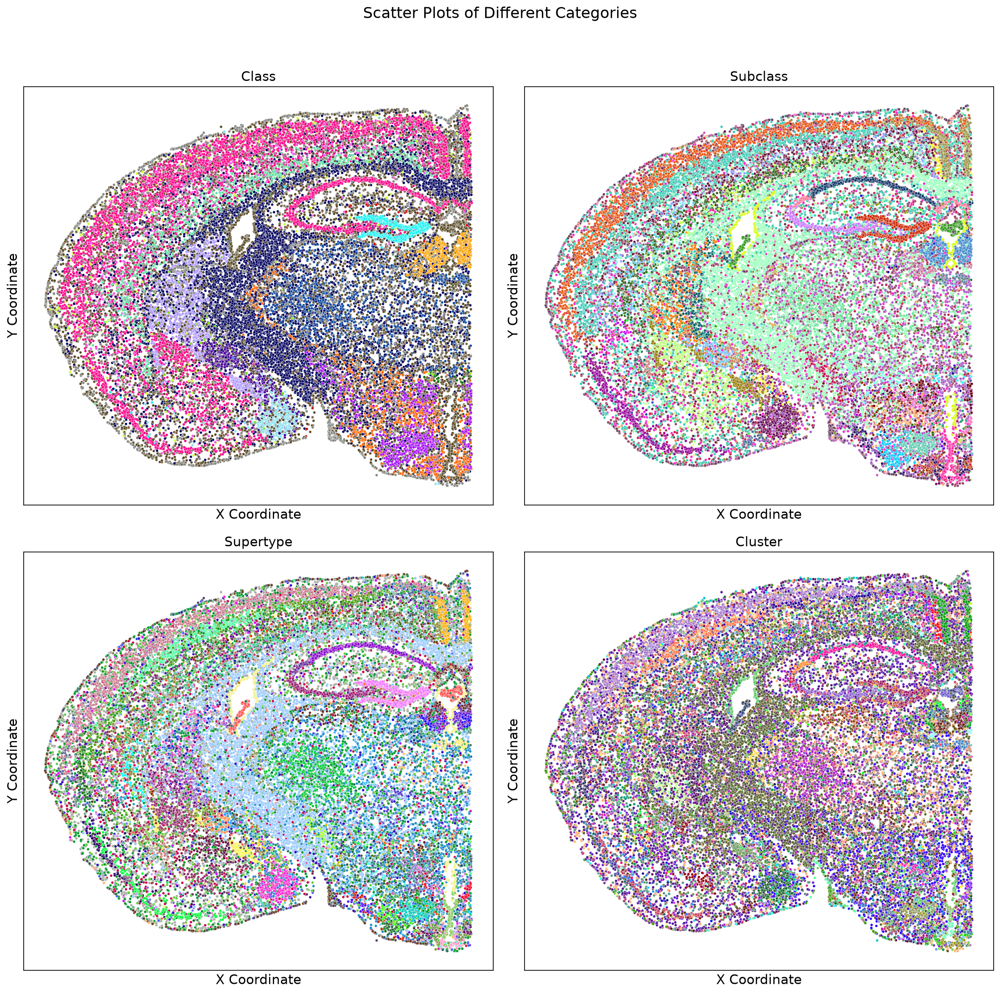

In [78]:
# Create the color mapping dictionaries
class_palette = dict(zip(adata_section.obs['class'].unique(), adata_section.obs['class_color'].unique()))
subclass_palette = dict(zip(adata_section.obs['subclass'].unique(), adata_section.obs['subclass_color'].unique()))
supertype_palette = dict(zip(adata_section.obs['supertype'].unique(), adata_section.obs['supertype_color'].unique()))
cluster_palette = dict(zip(adata_section.obs['cluster'].unique(), adata_section.obs['cluster_color'].unique()))

# Create the subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle('Scatter Plots of Different Categories', fontsize=16)

# Plot 'class' using class_color
sns.scatterplot(ax=axes[0, 0], x='x', y=-adata_section.obs['y'], hue='class', palette=class_palette, data=adata_section.obs, s=8, legend=False)
axes[0, 0].set_title('Class')
axes[0, 0].set_xlabel('X Coordinate')
axes[0, 0].set_ylabel('Y Coordinate')
axes[0, 0].tick_params(axis='both', which='both', bottom=False, left=False, labelbottom=False, labelleft=False)
axes[0, 0].grid(False)  # Remove grid

# Plot 'subclass' using subclass_color
sns.scatterplot(ax=axes[0, 1], x='x', y=-adata_section.obs['y'], hue='subclass', palette=subclass_palette, data=adata_section.obs, s=8, legend=False)
axes[0, 1].set_title('Subclass')
axes[0, 1].set_xlabel('X Coordinate')
axes[0, 1].set_ylabel('Y Coordinate')
axes[0, 1].tick_params(axis='both', which='both', bottom=False, left=False, labelbottom=False, labelleft=False)
axes[0, 1].grid(False)  # Remove grid

# Plot 'supertype' using supertype_color
sns.scatterplot(ax=axes[1, 0], x='x', y=-adata_section.obs['y'], hue='supertype', palette=supertype_palette, data=adata_section.obs, s=8, legend=False)
axes[1, 0].set_title('Supertype')
axes[1, 0].set_xlabel('X Coordinate')
axes[1, 0].set_ylabel('Y Coordinate')
axes[1, 0].tick_params(axis='both', which='both', bottom=False, left=False, labelbottom=False, labelleft=False)
axes[1, 0].grid(False)  # Remove grid

# Plot 'cluster' using cluster_color
sns.scatterplot(ax=axes[1, 1], x='x', y=-adata_section.obs['y'], hue='cluster', palette=cluster_palette, data=adata_section.obs, s=8, legend=False)
axes[1, 1].set_title('Cluster')
axes[1, 1].set_xlabel('X Coordinate')
axes[1, 1].set_ylabel('Y Coordinate')
axes[1, 1].tick_params(axis='both', which='both', bottom=False, left=False, labelbottom=False, labelleft=False)
axes[1, 1].grid(False)  # Remove grid

plt.tight_layout(rect=[0, 0, 1, 0.96])  
plt.show()


In [79]:
# add X_spatial
adata_section.obsm['X_spatial'] = np.array(adata_section.obs[['x','y']])
adata_section.obsm['X_spatial']

array([[5.89755466, 2.56616229],
       [5.89669954, 2.36799153],
       [5.90361542, 2.37595531],
       ...,
       [0.68256265, 4.16067999],
       [0.67580131, 4.23958099],
       [0.68058994, 4.17200014]], shape=(37068, 2))

<font size="3"> Once the spatial coordinates are stored in  `.obsm[X_spatial]` you can plot the section with `sc.pl.spatial`


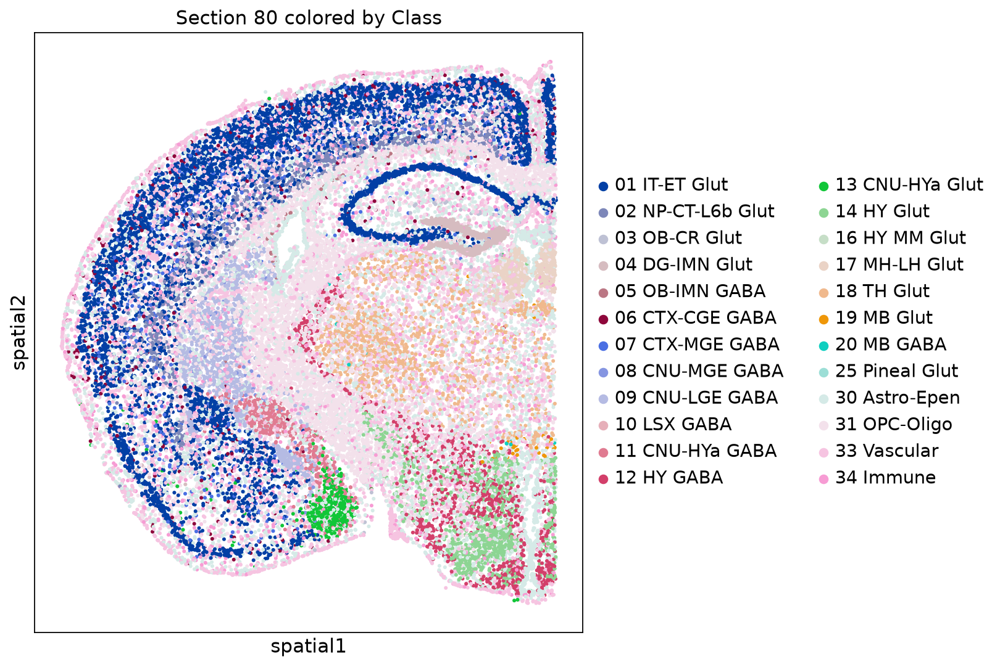

In [80]:
# Generate the spatial plot
sc.pl.spatial(adata_section, color='class', color_map='Accent_r', spot_size=0.04, title='Section 80 colored by Class')